# GoT_Character_network_analysis Ruben Tak

In this project, we explore network analysis and visualisation techniques applied to the popular book and HBO series "Game of Thrones." The goal is to gain insights into the relationships and importance of characters within the narrative using network graphs and centrality measures. The project utilises Python libraries such as NetworkX, Pandas, and Pyvis to analyse the network structure, visualize the connections between characters, and calculate centrality measures.

This project is part of a Medium article I wrote, which can be found [here](https://medium.com/@rubentak/game-of-thrones-character-relevance-evolution-9b6a3a0d9f3a).


# Network Analysis of Book 1: Game of Thrones

In [1]:
# Importing the required libraries
import networkx as nx
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [2]:
# Reading in the data of book 1
d1=pd.read_csv('../data/book1.csv')

In [3]:
# Printing out the head of the data
d1

,Source,Target,Type,weight,book
0,Addam-Marbrand,Jaime-Lannister,Undirected,3,1
1,Addam-Marbrand,Tywin-Lannister,Undirected,6,1
2,Aegon-I-Targaryen,Daenerys-Targaryen,Undirected,5,1
3,Aegon-I-Targaryen,Eddard-Stark,Undirected,4,1
4,Aemon-Targaryen-(Maester-Aemon),Alliser-Thorne,Undirected,4,1
...,...,...,...,...,...
679,Tyrion-Lannister,Willis-Wode,Undirected,4,1
680,Tyrion-Lannister,Yoren,Undirected,10,1
681,Tywin-Lannister,Varys,Undirected,4,1
682,Tywin-Lannister,Walder-Frey,Undirected,8,1


In [4]:
# Printing out the number of unique characters
print("Number of unique characters: ", len(d1['Source'].unique()))

Number of unique characters:  139


In [5]:
# Number of interactions per character
interactions_per_character = d1.groupby('Source')['Target'].count()
print("Average number of interactions per character: ", interactions_per_character.mean())

Average number of interactions per character:  4.920863309352518


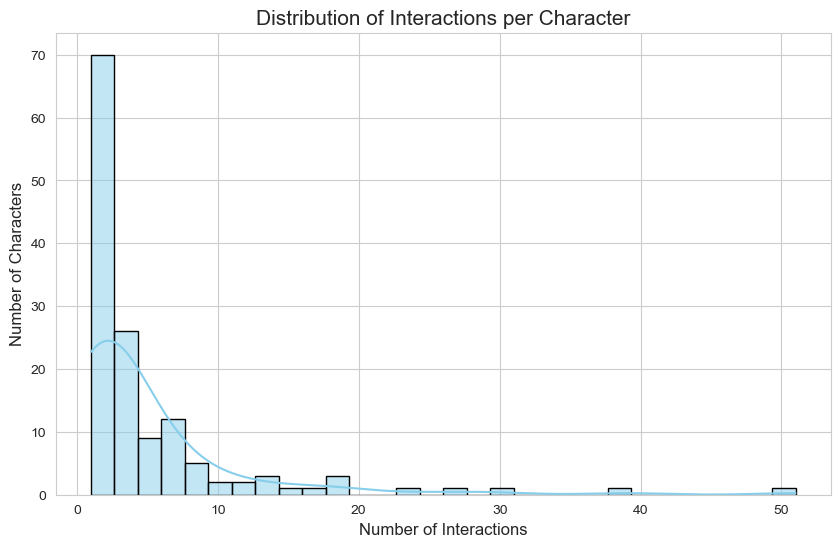

In [6]:
# Distribution of Interactions per Character
sns.set_style("whitegrid")

plt.figure(figsize=(10,6))
sns.histplot(interactions_per_character, bins=30, color='skyblue', edgecolor='black', kde=True)
plt.title('Distribution of Interactions per Character', fontsize=15)
plt.xlabel('Number of Interactions', fontsize=12)
plt.ylabel('Number of Characters', fontsize=12)
plt.show()

In [7]:
# top 10 characters by number of interactions
top_characters = interactions_per_character.sort_values(ascending=False).head(10)
print("Top 10 characters by number of interactions: \n", top_characters)

Top 10 characters by number of interactions: 
 Source
Eddard-Stark          51
Catelyn-Stark         39
Bran-Stark            30
Arya-Stark            27
Cersei-Lannister      23
Joffrey-Baratheon     19
Daenerys-Targaryen    18
Jaime-Lannister       18
Jon-Snow              17
Drogo                 15
Name: Target, dtype: int64


# Analyse edges of the network
This code will give you a list of the pairs of characters (edges) that have the most interactions (highest weights), and a histogram showing the distribution of edge weights. The edge weight is the sum of the 'weight' column for each pair of characters, which represents the number of interactions between them.

In [8]:
# Create a DataFrame that counts the number of interactions (weights) between each pair of characters
edge_weights = d1.groupby(['Source', 'Target'])['weight'].sum().reset_index(name='weight')

In [9]:
# Sort the DataFrame by the weight and display the top edges
top_edges = edge_weights.sort_values(by='weight', ascending=False).head(10)
print("Top 10 edges by weight: \n", top_edges)

Top 10 edges by weight: 
                  Source            Target  weight
329        Eddard-Stark  Robert-Baratheon     291
134          Bran-Stark        Robb-Stark     112
62           Arya-Stark       Sansa-Stark     104
249  Daenerys-Targaryen             Drogo     101
479   Joffrey-Baratheon       Sansa-Stark      87
504            Jon-Snow     Samwell-Tarly      81
454        Jeor-Mormont          Jon-Snow      81
320        Eddard-Stark     Petyr-Baelish      81
257  Daenerys-Targaryen     Jorah-Mormont      75
225    Cersei-Lannister  Robert-Baratheon      72


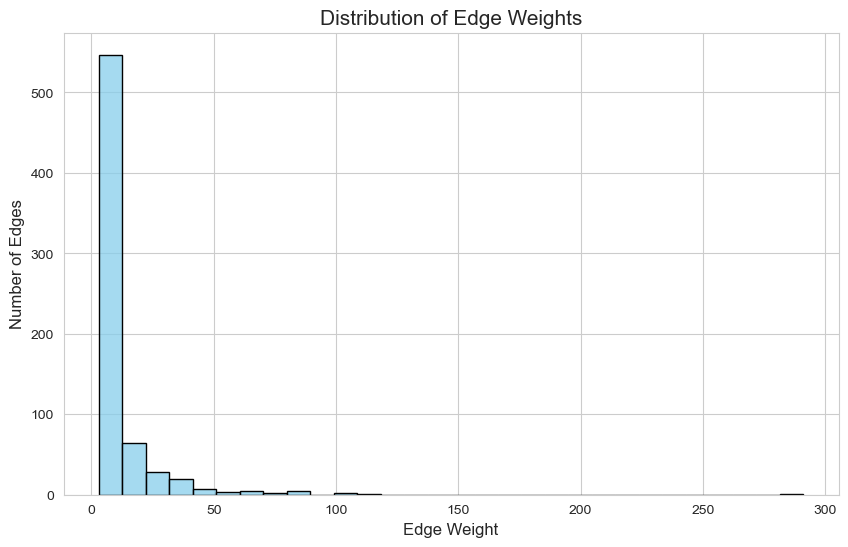

In [101]:
# Plot a histogram of edge weights
plt.figure(figsize=(10,6))
sns.histplot(edge_weights['weight'], bins=30, color='skyblue', edgecolor='black', kde=False)
plt.title('Distribution of Edge Weights', fontsize=15)
plt.xlabel('Edge Weight', fontsize=12)
plt.ylabel('Number of Edges', fontsize=12)
plt.show()

# Visualizing networks using NetworkX

NetworkX is a Python package for the creation, manipulation, and study of the structure, dynamics, and functions of complex networks. It provides data structures for representing many types of networks, or graphs, including simple graphs, directed graphs, and multigraphs. It also provides nodes and edges with optional data, or attributes.

In [70]:
# Creating an empty graph object
b1 = nx.Graph()

In [71]:
# Iterating through the DataFrame to add edges
for _, edge in d1.iterrows():
    b1.add_edge(edge['Source'], edge['Target'], weight=edge['weight'])

In [72]:
# Printing out the number of nodes and edges in the graph
print("Total number of nodes: ", int(b1.number_of_nodes()))
print("Total number of edges: ", int(b1.number_of_edges()))

Total number of nodes:  187
Total number of edges:  684


I will plot the network of book 1 using 5 different layouts to see which one is the most readable.

1. Nx.draw(): default spring layout
2. Nx.draw_circular(): Nodes are positioned in a circle around the center
3. Nx.draw_kamada_kawai(): Positions nodes using the force-directed method of Kamada and Kawai.
4. Nx.draw_spring(): Fruchterman-Reingold force-directed algorithm.
5. Nx.draw_random(): Nodes are positioned uniformly at random in the unit square.


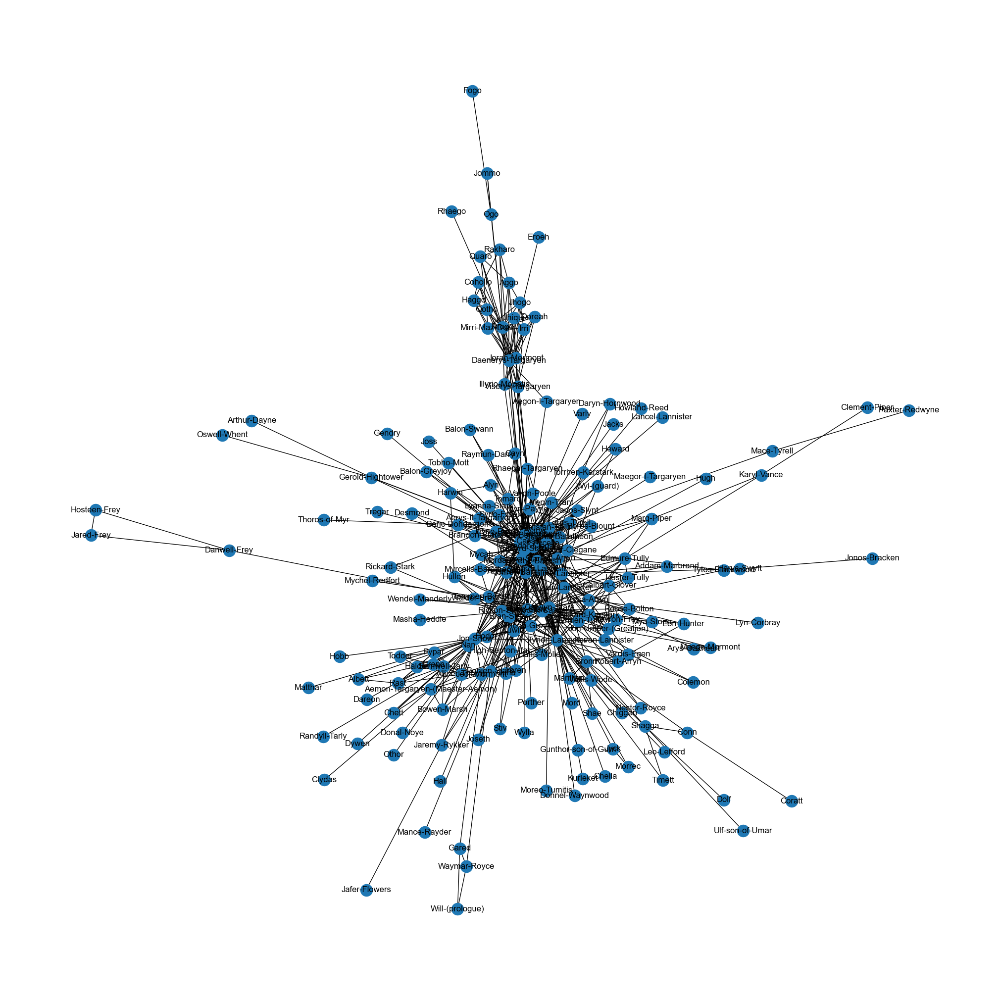

In [73]:
plt.figure(figsize =(20, 20)) 
nx.draw(b1, with_labels= True)

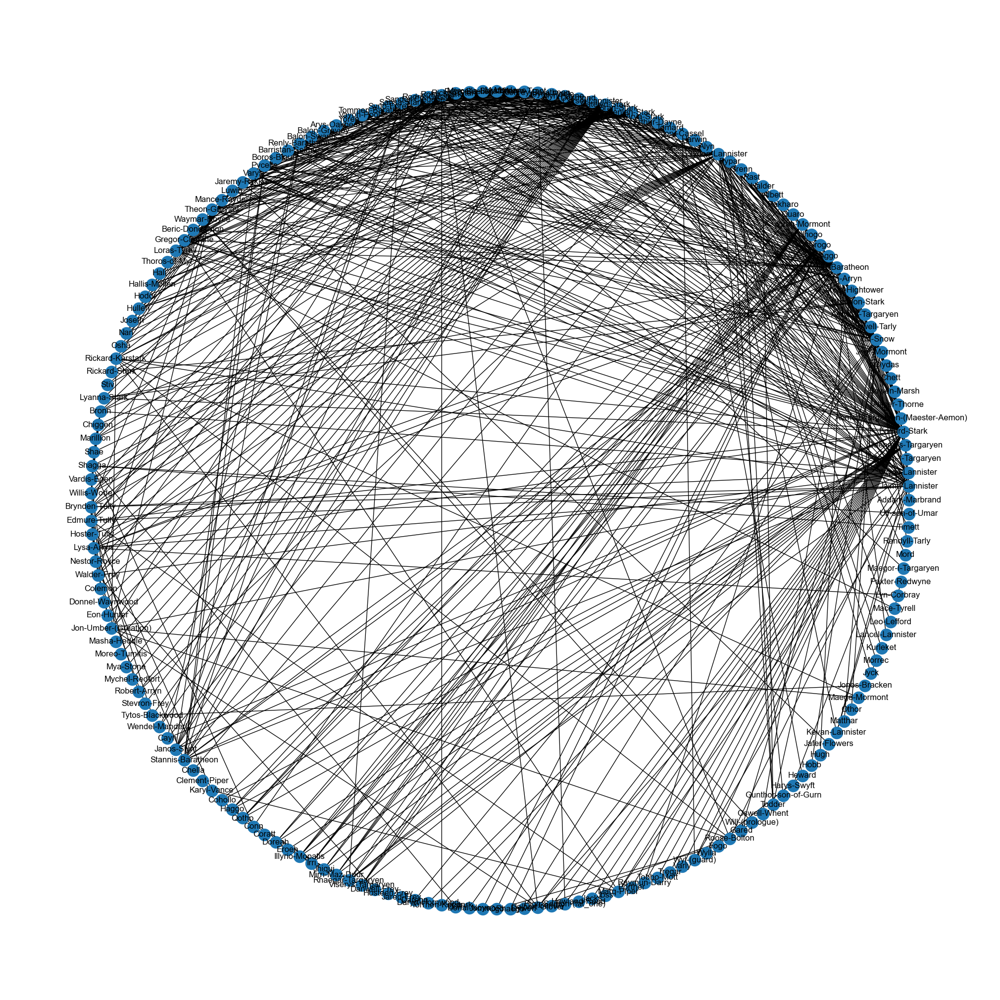

In [74]:
plt.figure(figsize =(20, 20))
nx.draw_circular(b1, with_labels= True)

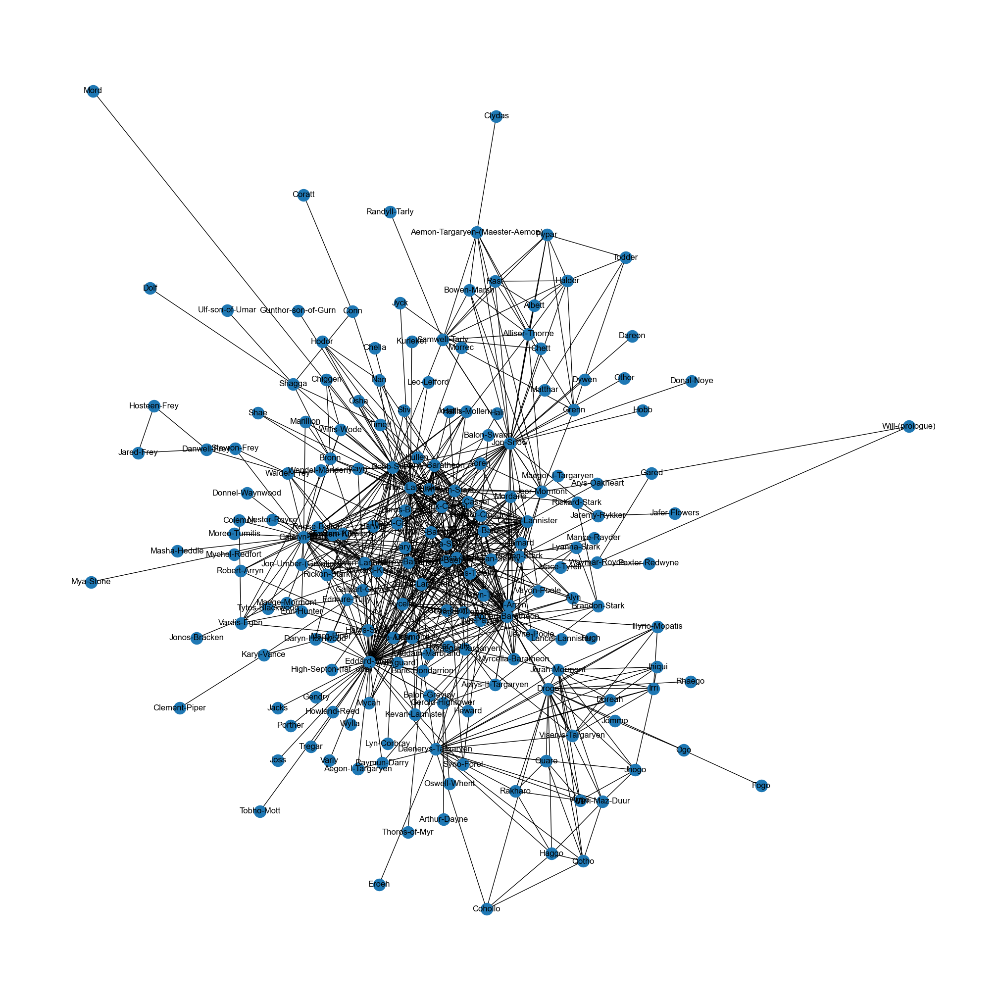

In [75]:
plt.figure(figsize =(20, 20))
nx.draw_kamada_kawai(b1, with_labels= True)

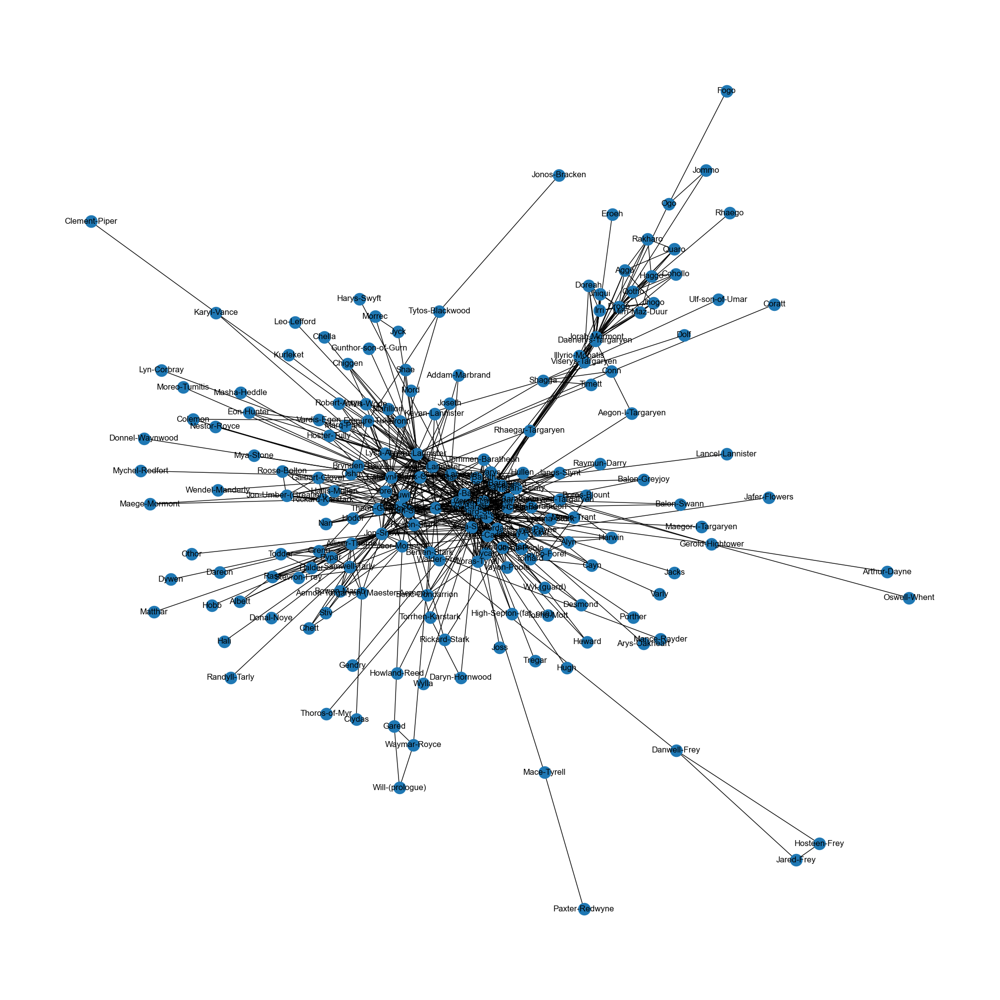

In [76]:
plt.figure(figsize =(20, 20))
nx.draw_spring(b1, with_labels= True)

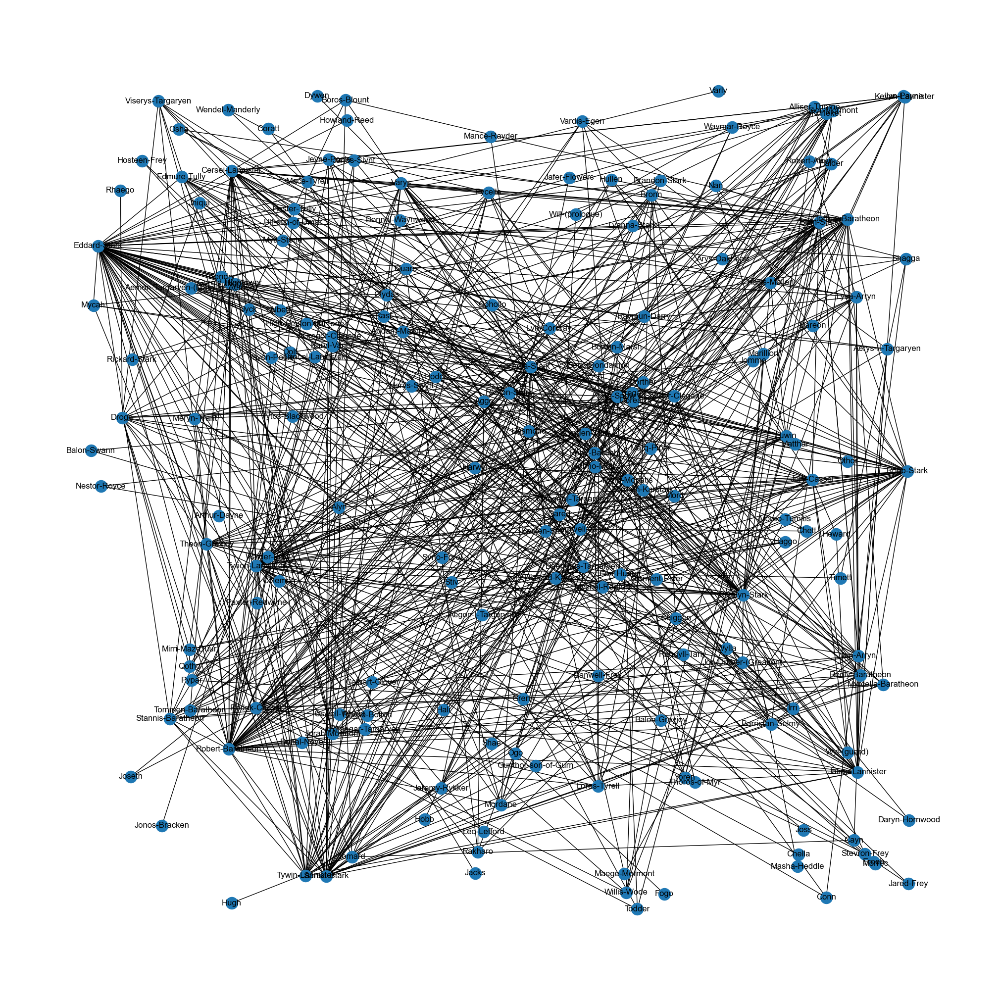

In [77]:
plt.figure(figsize =(20, 20))
nx.draw_random(b1, with_labels= True)

# Visualizing using Pyvis

Pyvis is a Python library to visualize networks using vis.js. It is a port of the popular R package, networkD3. It is primarily used in Jupyter notebook, but it also has the ability to generate HTML files.

As I did not find the visualization of the network using nx.draw() very readable, I will use Pyvis to visualize the network of book 1.


**Important**: this needs to be ran in a Jupyter notebook, it will not work in Pycharm. On the ride side there is a small space to scroll down and modify the buttons and with that the visualization.

**Important**: In the buttons, I recommend to click on the first one to stop the physics of the network, otherwise it will be moving all the time and it will be difficult to read.

In [78]:
from pyvis.network import Network
net = Network(notebook=True, height='950px', width='95%', bgcolor='#222222', font_color='black', cdn_resources='remote')

node_degree = dict(b1.degree())

# set node size and atrributes
nx.set_node_attributes(b1, node_degree, 'Size')


net.from_nx(b1)
net.show_buttons()
net.show("nx.html")

nx.html


# Community detection

It is already a nice visualisation, but it is still difficult to read. I will try to use community detection to see if it is possible to make it more readable.

In [79]:
from community import community_louvain
communities = community_louvain.best_partition(b1)
communities

{'Addam-Marbrand': 0,
 'Jaime-Lannister': 0,
 'Tywin-Lannister': 0,
 'Aegon-I-Targaryen': 1,
 'Daenerys-Targaryen': 2,
 'Eddard-Stark': 1,
 'Aemon-Targaryen-(Maester-Aemon)': 3,
 'Alliser-Thorne': 3,
 'Bowen-Marsh': 3,
 'Chett': 3,
 'Clydas': 3,
 'Jeor-Mormont': 3,
 'Jon-Snow': 3,
 'Samwell-Tarly': 3,
 'Aerys-II-Targaryen': 1,
 'Brandon-Stark': 1,
 'Gerold-Hightower': 1,
 'Jon-Arryn': 4,
 'Robert-Baratheon': 4,
 'Aggo': 2,
 'Drogo': 2,
 'Jhogo': 2,
 'Jorah-Mormont': 2,
 'Quaro': 2,
 'Rakharo': 2,
 'Albett': 3,
 'Halder': 3,
 'Rast': 3,
 'Grenn': 3,
 'Pypar': 3,
 'Tyrion-Lannister': 5,
 'Alyn': 6,
 'Harwin': 6,
 'Jory-Cassel': 6,
 'Tomard': 1,
 'Arthur-Dayne': 1,
 'Arya-Stark': 4,
 'Benjen-Stark': 6,
 'Bran-Stark': 6,
 'Catelyn-Stark': 0,
 'Cersei-Lannister': 4,
 'Desmond': 1,
 'Ilyn-Payne': 4,
 'Jeyne-Poole': 4,
 'Joffrey-Baratheon': 4,
 'Meryn-Trant': 4,
 'Mordane': 4,
 'Mycah': 4,
 'Myrcella-Baratheon': 4,
 'Petyr-Baelish': 4,
 'Rickon-Stark': 6,
 'Robb-Stark': 6,
 'Rodrik-Cassel': 6

In [80]:
# Adding the community to the nodes
nx.set_node_attributes(b1, communities, 'group')

In [81]:
# Adding the community to the nodes
nx.set_node_attributes(b1, communities, 'group')
from pyvis.network import Network

net = Network(notebook=True, height='950px', width='99%', bgcolor='#222222', font_color='white', cdn_resources='remote')

node_degree = dict(b1.degree)

#Setting up node size attribute
nx.set_node_attributes(b1, node_degree, 'size')

net.from_nx(b1)
net.show_buttons()
net.show("nx.html")

nx.html


In [82]:
# Network Diameter
# The diameter is the maximum eccentricity.
diameter = nx.diameter(b1)
print("Network diameter: ", diameter)

Network diameter:  7


In [83]:
# Average Path Length
# The average shortest path length is the sum of the lengths of all shortest paths divided by the number of pairs of nodes.
avg_path_length = nx.average_shortest_path_length(b1)
print("Average path length: ", avg_path_length)

Average path length:  2.9124259674544306


In [84]:
# Clustering Coefficient
# The clustering coefficient of a node in a graph quantifies how close its neighbors are to being a clique (complete graph).
clustering_coefficient = nx.average_clustering(b1)
print("Average clustering coefficient: ", clustering_coefficient)

Average clustering coefficient:  0.5121189412047715


The average clustering coefficient of 0.512 suggests that there is a moderate level of clustering in the network. This means that, on average, about 51.2% of your nodes' neighbors are also neighbors with each other. In other words, your characters tend to form tightly knit groups, which is a common occurrence in social networks.

The average path length of 2.912 means that on average, one character is about 2-3 "steps" away from another character in the network. This suggests that your network has the small-world property, which is also typical of social networks. The small-world property refers to the phenomenon where most pairs of nodes are connected by a relatively short path.

The network diameter of 7 means that the longest shortest path between any two nodes in the network is 7. This is the maximum number of steps from one character to another. This suggests that while your network is relatively well-connected, there are some pairs of characters that are quite far apart.

In conclusion, your network exhibits properties typical of social networks, with a moderate level of clustering and small-world property. However, there are some characters that are relatively isolated from each other, as indicated by the network diameter.